# Multi-filter response: [185, 232, 62, 127, 21, 74]

MODEL: unit-wnet-wrferaext18-32f-mean0-ose-trainer-3resblks-3ds-bse2-drop2-dr3-ssim-simenc2
gen_00725001.pt



### multi-filter subs


In [2317]:
def calc_filter_variance(input_chunk, bn_mean_era, gen, filters):
    generated_chunk = gen.decode(bn_mean_era).detach().numpy()
    avg_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    avg_decoded_denorm = generated_chunk_denorm[0]

    encoded_extreme = gen.encode(input_chunk)[0].detach()
    generated_chunk = gen.decode(encoded_extreme).detach().numpy()
    front_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    front_decoded_denorm = generated_chunk_denorm[0]

    newbn = bn_mean_era.clone()

    for ff in filters:
        newbn[0, ff, :, :] = encoded_extreme[0, ff, :, :].clone()

    generated_chunk = gen.decode(newbn).detach().numpy()
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk_denorm = generated_chunk_denorm[0]

    err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(front_decoded)).detach())
    err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(front_decoded[ii])).detach())) for ii in range(18)]

    return [err, err18, filters, generated_chunk_denorm - avg_decoded_denorm]

In [2732]:
def get_filter_substitutions_minmax(storms, filters, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, stormcount, vmax=None, vmin=None):
    vmax = [-9999 for y in range(18)]  
    vmin = [9999 for y in range(18)]           

    for ii in range(stormcount): #range(len(storms)):
        input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
        input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

        xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, filters)

        vmin_temp = [xx[3][ii].mean() - xx[3][ii].std()*2 for ii in range(18)]
        vmax_temp = [xx[3][ii].mean() + xx[3][ii].std()*2 for ii in range(18)]

        vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
        vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]
        
    return vmin, vmax


def apply_filter_substitutions(storms, filters, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, stormcount, vmin=None, vmax=None):
    
    for ii in range(stormcount): #range(len(storms)):
        print('\nSTORM INDEX:', ii)
        input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
        input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

        xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, filters)
        print(np.array(xx[3]).shape)

        if vmax == None or vmin == None:
            vmax = [-9999 for y in range(18)]  
            vmin = [9999 for y in range(18)]           
            vmin_temp = [xx[3][ii].mean() - xx[3][ii].std()*2 for ii in range(18)]
            vmax_temp = [xx[3][ii].mean() + xx[3][ii].std()*2 for ii in range(18)]

            vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
            vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]

        print("FILTERS", filters)
        svars = [0, 1, 2, 3, 4, 5, 6, 7, 8]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        svars = [9, 10, 11, 12, 13, 14, 15, 16, 17]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        
    return vmin, vmax

In [2631]:
storms.shape

torch.Size([26, 18, 192, 256])

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys



STORM INDEX: 0


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


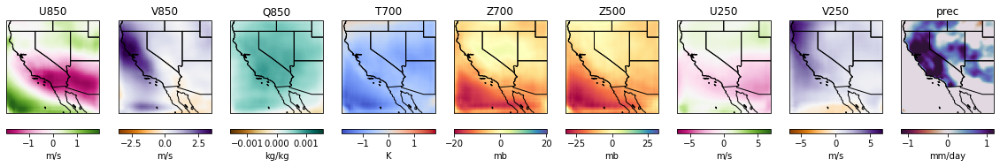

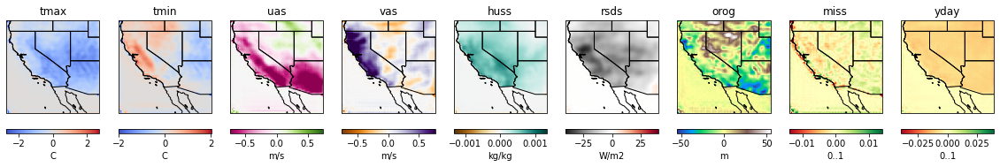


STORM INDEX: 1


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


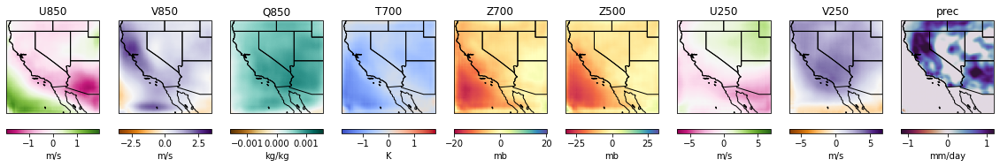

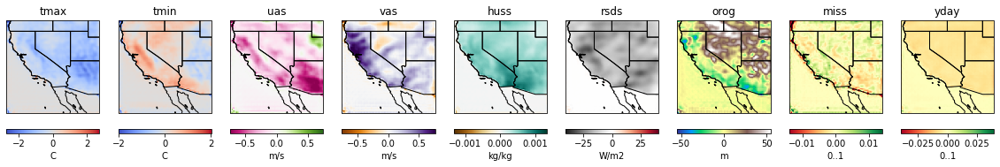


STORM INDEX: 2


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


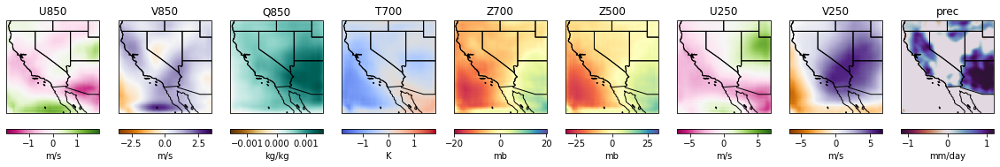

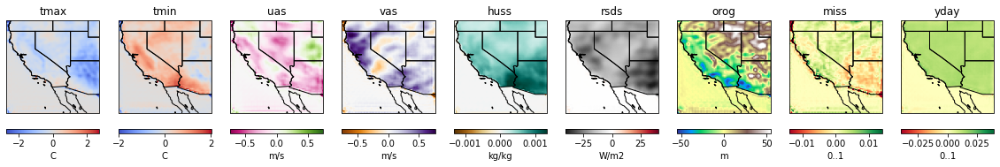


STORM INDEX: 3


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


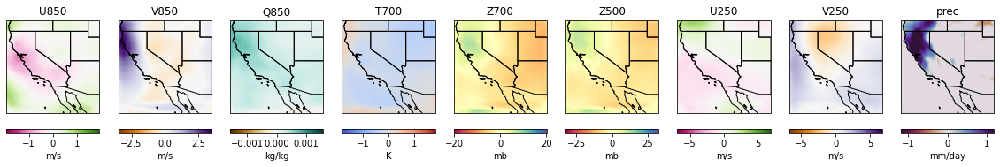

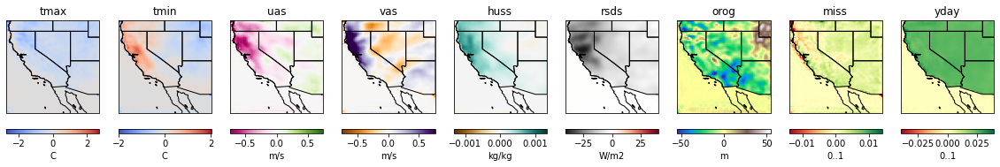


STORM INDEX: 4


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


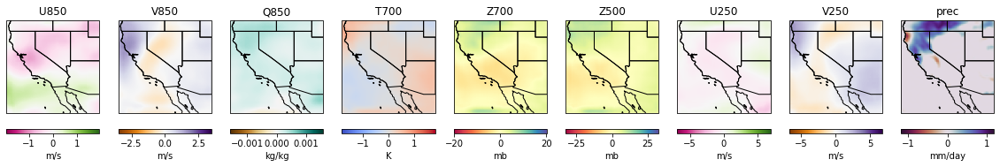

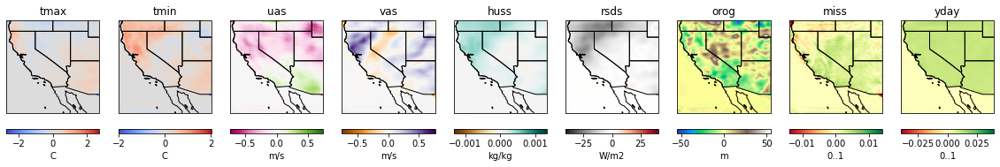


STORM INDEX: 5


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


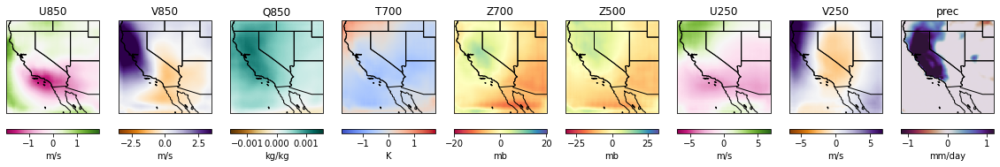

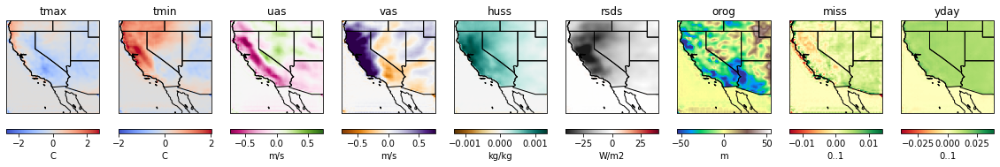


STORM INDEX: 6


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


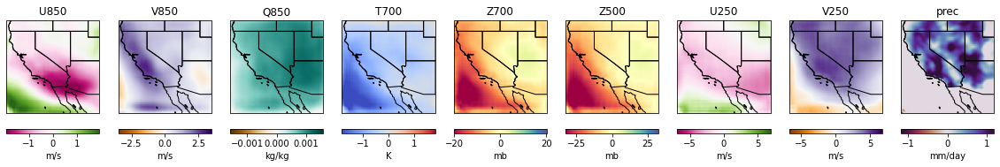

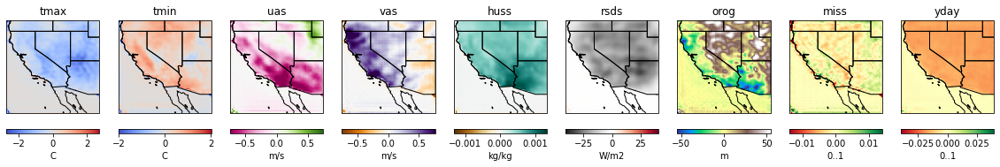


STORM INDEX: 7


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


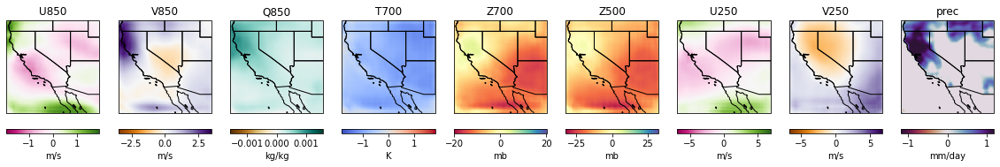

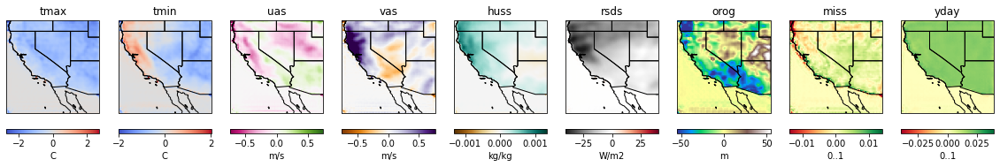


STORM INDEX: 8


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


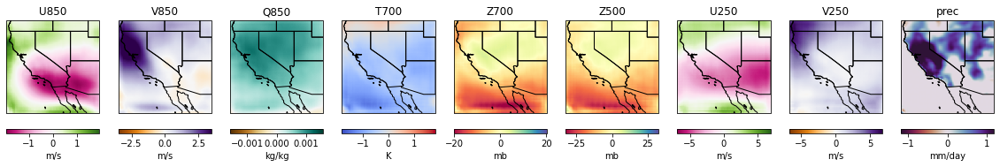

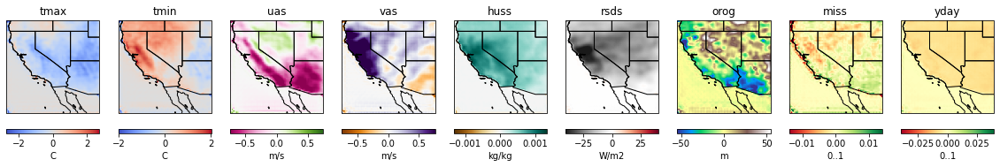


STORM INDEX: 9


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


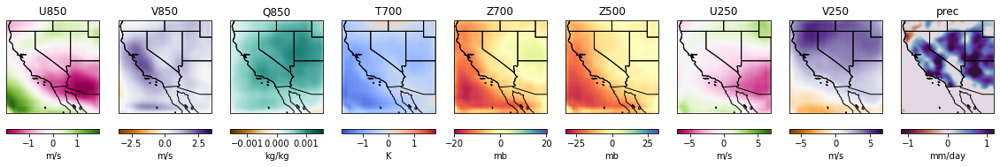

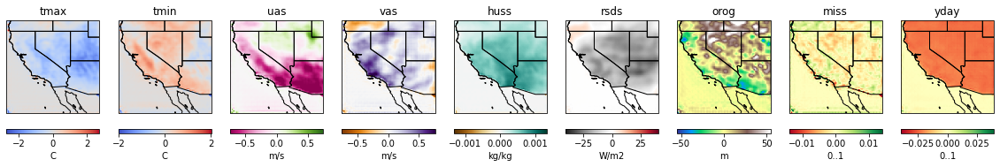


STORM INDEX: 10


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


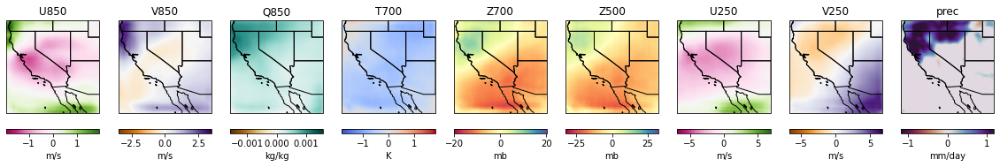

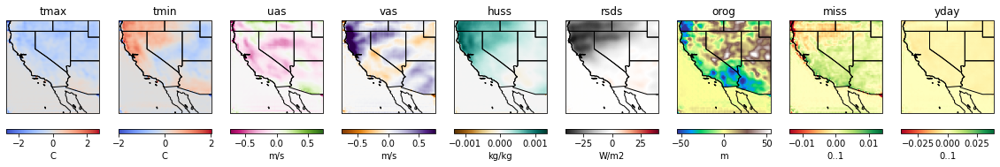


STORM INDEX: 11


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


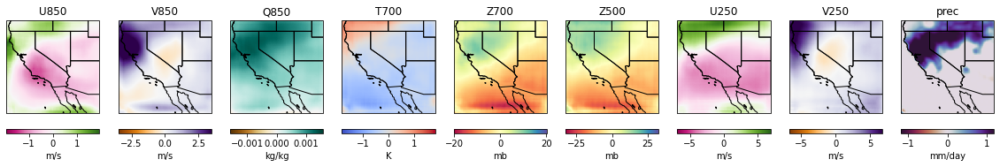

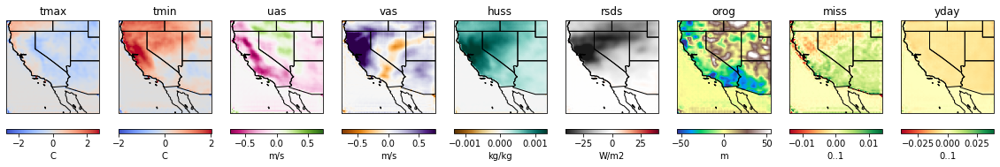


STORM INDEX: 12


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


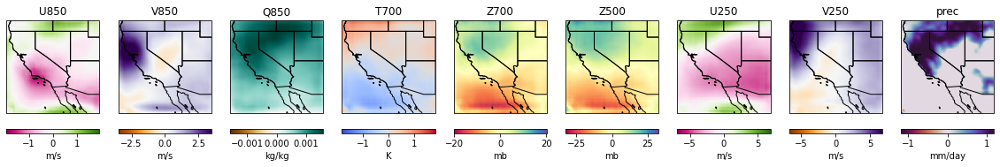

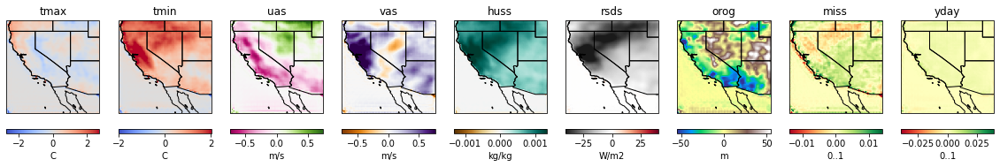


STORM INDEX: 13


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


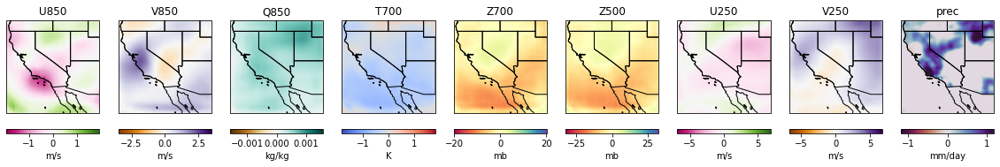

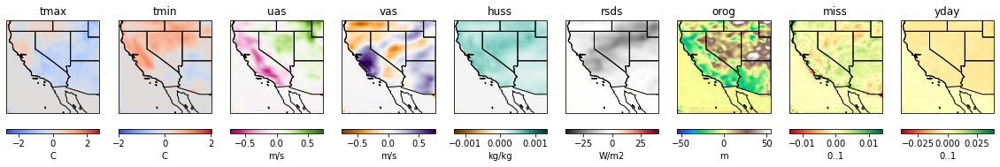


STORM INDEX: 14


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


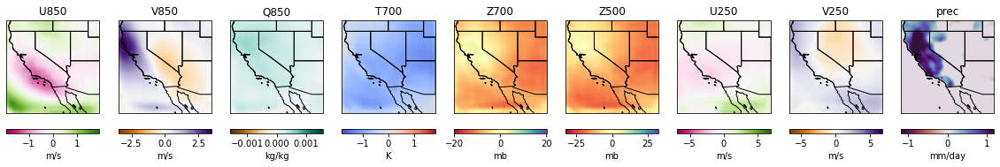

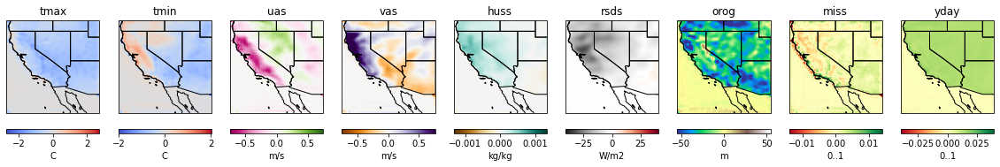


STORM INDEX: 15


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


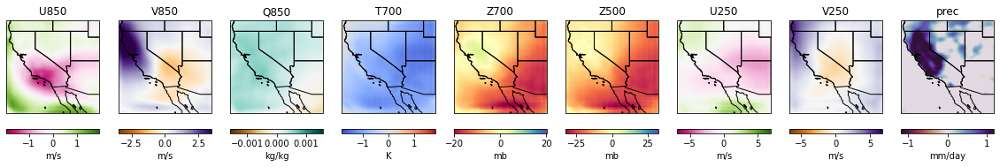

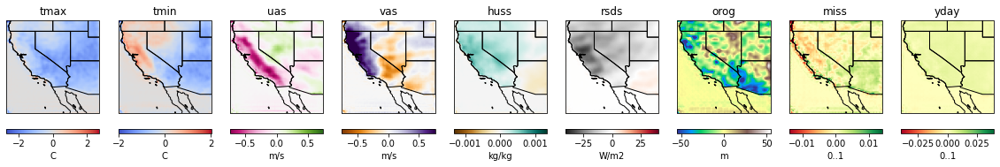


STORM INDEX: 16


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


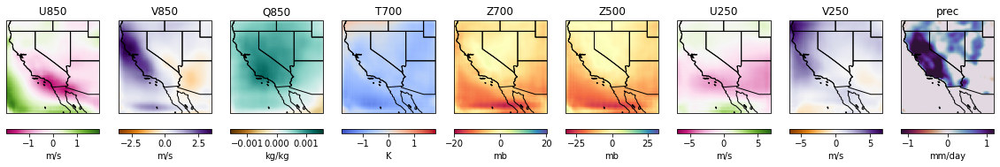

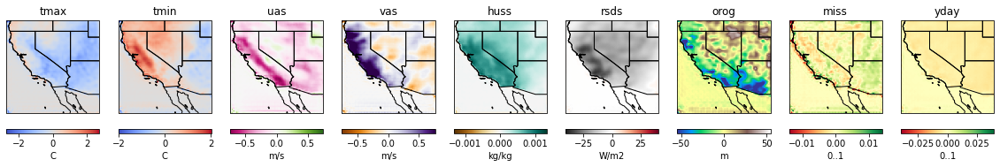


STORM INDEX: 17


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


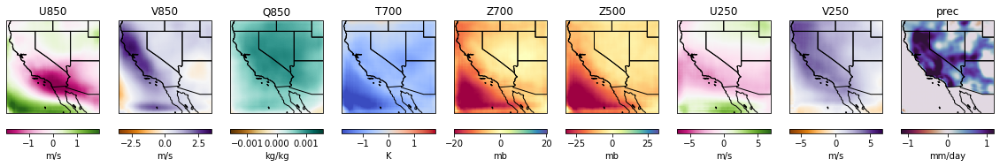

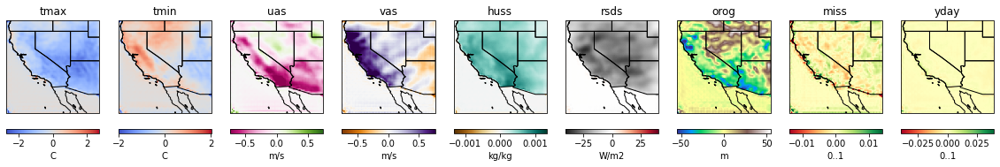


STORM INDEX: 18


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


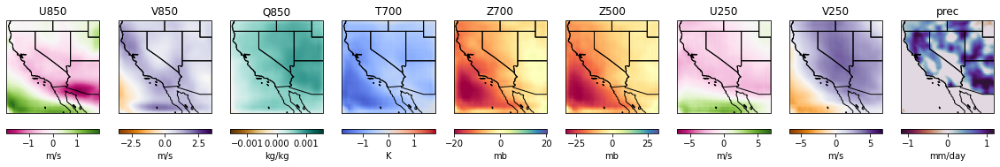

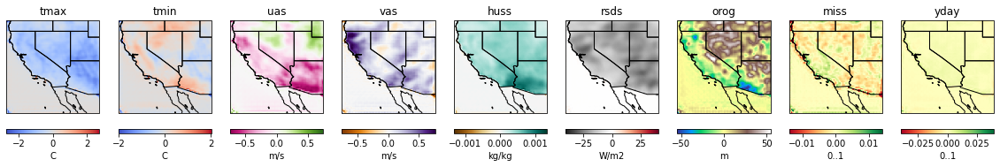


STORM INDEX: 19


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


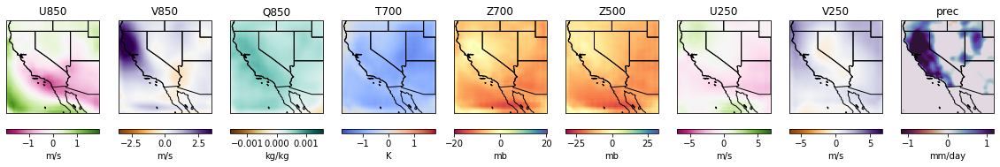

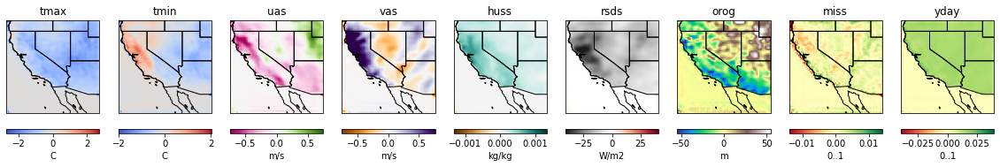


STORM INDEX: 20


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


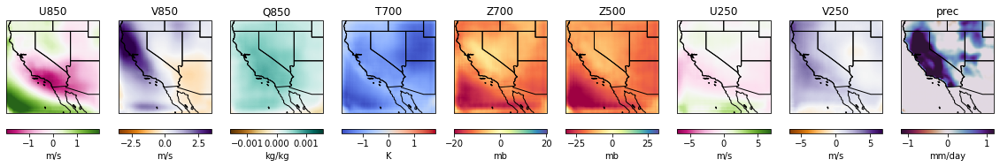

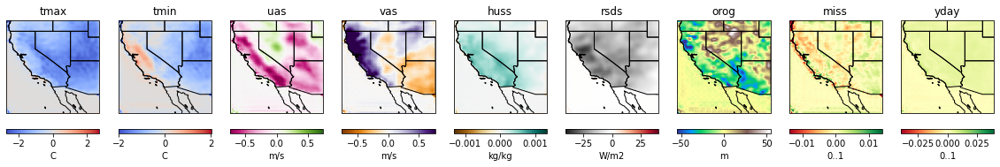


STORM INDEX: 21


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


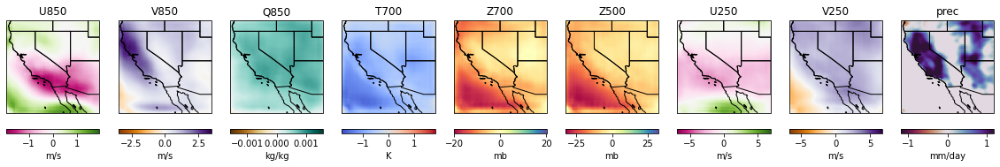

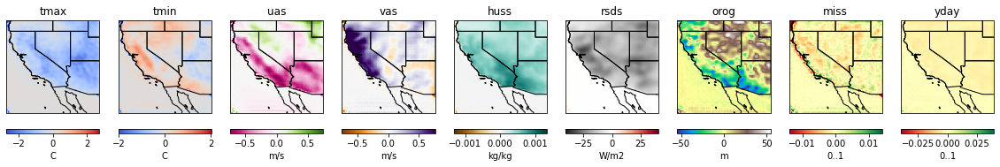


STORM INDEX: 22


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


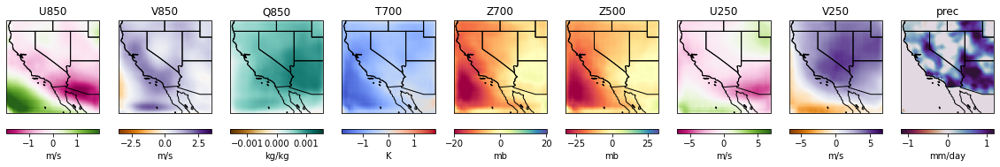

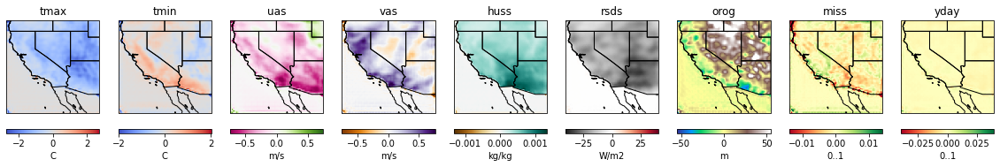


STORM INDEX: 23


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


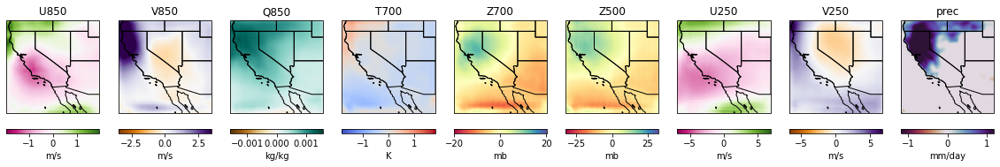

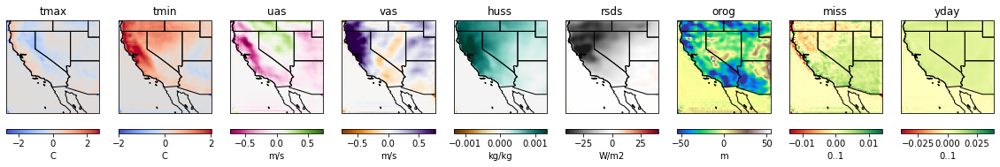


STORM INDEX: 24


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


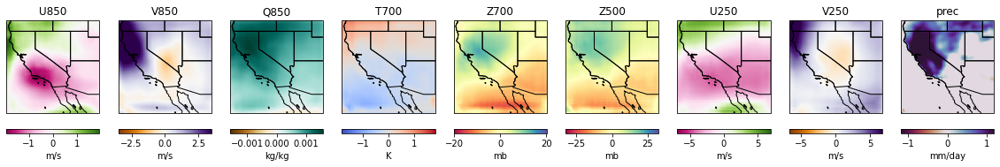

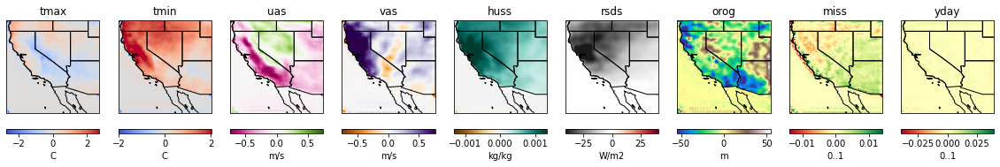


STORM INDEX: 25


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


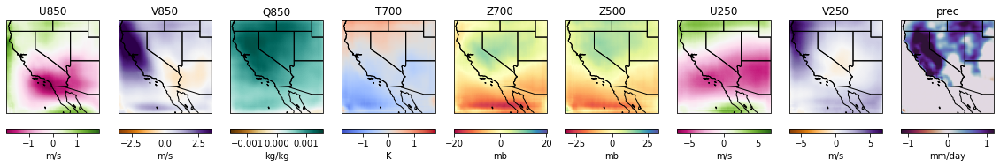

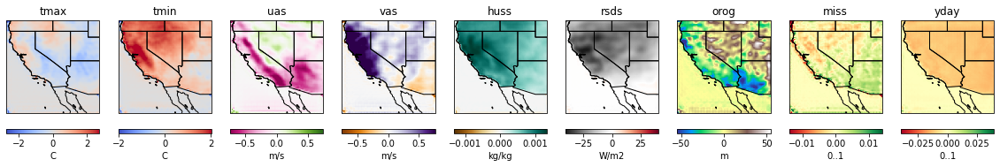

([-1.9315390134848012,
  -2.2428989308014944,
  -0.0001078265330054997,
  -1.8181514108966574,
  -20.271422524290955,
  -32.434792123948775,
  -6.89195411130172,
  -3.615020370226795,
  -0.6412443858233468,
  -2.7356955200900153,
  -1.493837523444762,
  -0.7493102045527134,
  -0.5139218804164317,
  -0.00046044575855648214,
  -40.417482889378945,
  -54.59726343060903,
  -0.013662256132480458,
  -0.03614845885452357],
 [1.5628620122173245,
  3.4995771957465855,
  0.0015897844419795186,
  0.808390884336788,
  12.914216742427357,
  24.02938987586002,
  4.754444732946548,
  6.707520150903487,
  1.192078410206088,
  0.8638261699527721,
  2.0268369437342093,
  0.4458968867065112,
  0.7643641172423593,
  0.0013378421002323616,
  15.897841946964022,
  52.28111139301589,
  0.014052715493405626,
  0.039769208922209934])

In [2733]:
#apply_filter_substitutions(storms, [0, 1, 2], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
vmin,vmax = get_filter_substitutions_minmax(storms, [185, 232, 62, 127, 21, 74], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 26)
apply_filter_substitutions(storms, [185, 232, 62, 127, 21, 74], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 26, vmin=vmin, vmax=vmax)

#apply_filter_substitutions(storms, [111, 7, 81, 94, 241, 39, 141, 100, 29, 12, 125, 70, 162, 222, 240, 183, 185, 231, 236, 87, 47, 119, 48, 82, 107, 101, 113, 74, 91, 23, 128, 126, 173, 202, 220, 36, 57, 242, 83, 175, 127, 164, 146, 234, 33, 174, 195, 212, 15, 21, 201, 215, 79, 157, 177, 11, 142, 85, 88, 253, 32, 151, 192, 92, 136, 77, 40, 67, 147, 163, 114, 211, 102, 224]
#, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
